In [2]:
# BASE
# ------------------------------------------------------
import numpy as np
import pandas as pd
import os
import gc
import warnings

# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm

# DATA VISUALIZATION
# ------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# CONFIGURATIONS
# ------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [3]:
# Import
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
stores = pd.read_csv("stores.csv")
#sub = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")   
transactions = pd.read_csv("transactions.csv").sort_values(["store_nbr", "date"])


# Datetime
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)

# Data types
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00
1,1,2013-01-01,1,BABY CARE,0.00,0.00
2,2,2013-01-01,1,BEAUTY,0.00,0.00
3,3,2013-01-01,1,BEVERAGES,0.00,0.00
4,4,2013-01-01,1,BOOKS,0.00,0.00


In [12]:
train.groupby(["family"])["onpromotion"].sum()

family
AUTOMOTIVE                      4783.00
BABY CARE                         53.00
BEAUTY                         13483.00
BEVERAGES                     906958.00
BOOKS                              0.00
BREAD/BAKERY                  331289.00
CELEBRATION                     6723.00
CLEANING                      661157.00
DAIRY                         728707.00
DELI                          583316.00
EGGS                          194922.00
FROZEN FOODS                  125634.00
GROCERY I                    1914801.00
GROCERY II                      7347.00
HARDWARE                         163.00
HOME AND KITCHEN I             46921.00
HOME AND KITCHEN II            32814.00
HOME APPLIANCES                   58.00
HOME CARE                     197230.00
LADIESWEAR                      1680.00
LAWN AND GARDEN                11208.00
LINGERIE                        2815.00
LIQUOR,WINE,BEER               46700.00
MAGAZINES                        297.00
MEATS                         304

In [13]:
test.groupby(["family"])["onpromotion"].sum()

family
AUTOMOTIVE                       19
BABY CARE                         1
BEAUTY                          698
BEVERAGES                     22381
BOOKS                             0
BREAD/BAKERY                  10090
CELEBRATION                      27
CLEANING                      14834
DAIRY                         20457
DELI                          12349
EGGS                           2687
FROZEN FOODS                    968
GROCERY I                     49173
GROCERY II                      173
HARDWARE                          3
HOME AND KITCHEN I              655
HOME AND KITCHEN II            1415
HOME APPLIANCES                   0
HOME CARE                      6291
LADIESWEAR                      698
LAWN AND GARDEN                1251
LINGERIE                       1002
LIQUOR,WINE,BEER               2751
MAGAZINES                         6
MEATS                          4030
PERSONAL CARE                  9779
PET SUPPLIES                      7
PLAYERS AND ELECTRONI

In [14]:
train.groupby(["store_nbr"])["sales"].sum()

store_nbr
1    14145013.00
2    21557388.00
3    50481912.00
4    18909700.00
5    15592405.00
6    25183680.00
7    26952050.00
8    30494286.00
9    26409442.00
10    9613906.00
11   28325558.00
12   10659218.00
13   10523046.00
14   11387919.00
15   11451270.00
16   10986413.00
17   18030970.00
18   13259376.00
19   13049510.00
20   12920955.00
21    9255506.00
22    4090201.75
23   11651381.00
24   23767732.00
25   11420998.00
26    7755122.00
27   19188022.00
28   18383154.00
29    9725158.00
30    7382073.50
31   17746872.00
32    5951796.00
33   14178501.00
34   17090734.00
35    7676679.50
36   15322431.00
37   19970636.00
38   18860000.00
39   20252192.00
40   18395758.00
41   14991039.00
42    8945768.00
43   16391692.00
44   62087552.00
45   54498012.00
46   41896064.00
47   50948312.00
48   35933132.00
49   43420096.00
50   28653020.00
51   32911490.00
52    2696169.75
53   11216167.00
54   11057483.00
Name: sales, dtype: float32

In [15]:
# Import 
oil = pd.read_csv("oil.csv")
oil["date"] = pd.to_datetime(oil.date)
# Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
p = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

Correlation with Daily Oil Prices
sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolated, dtype: float64 



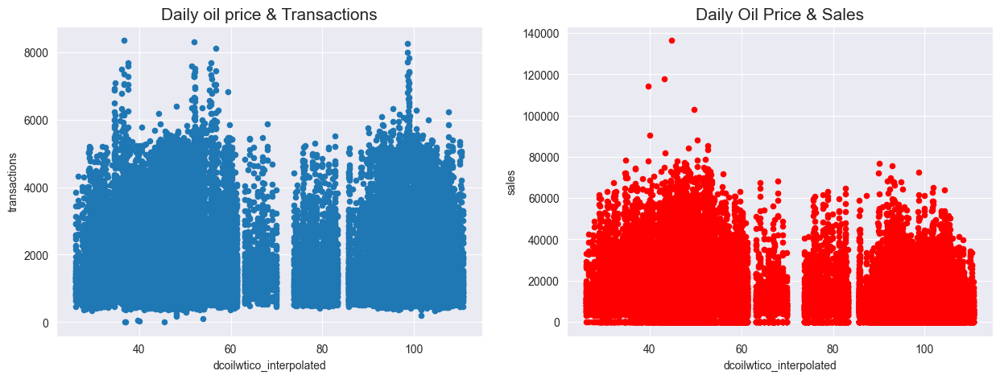

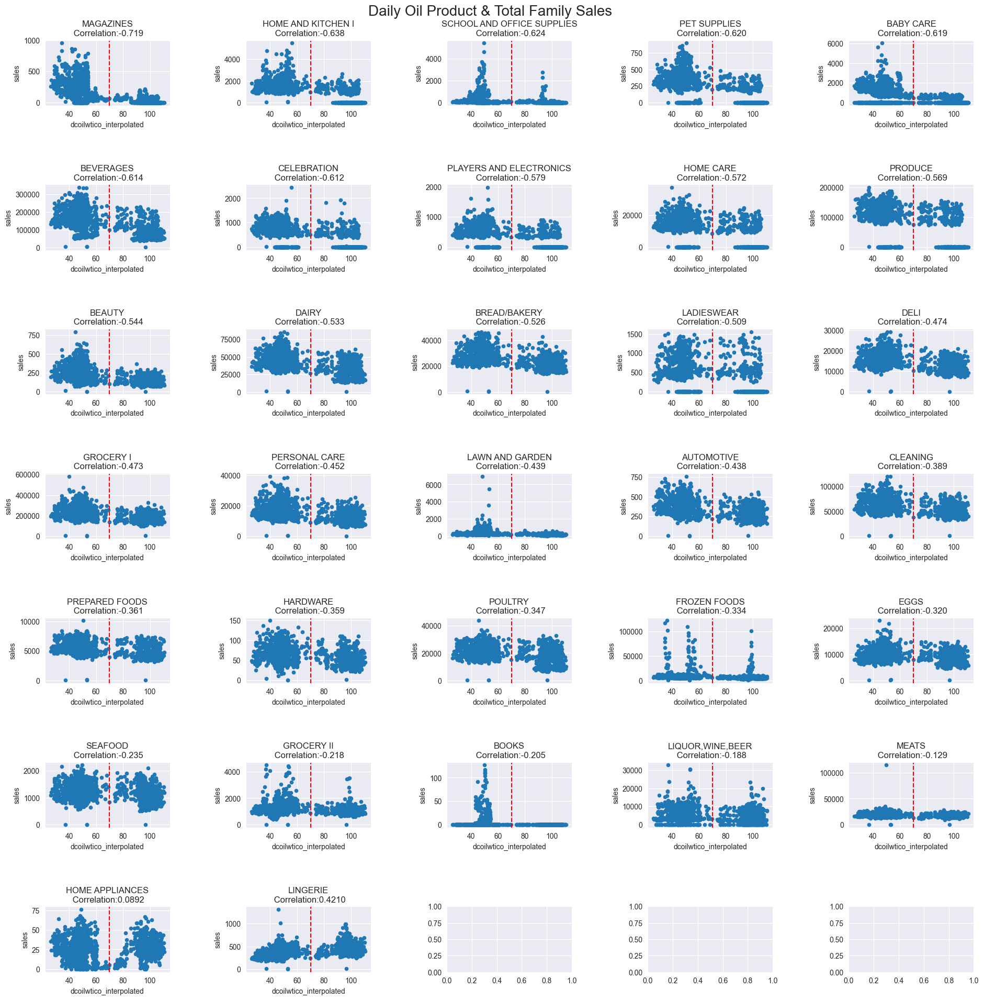

In [17]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()
        

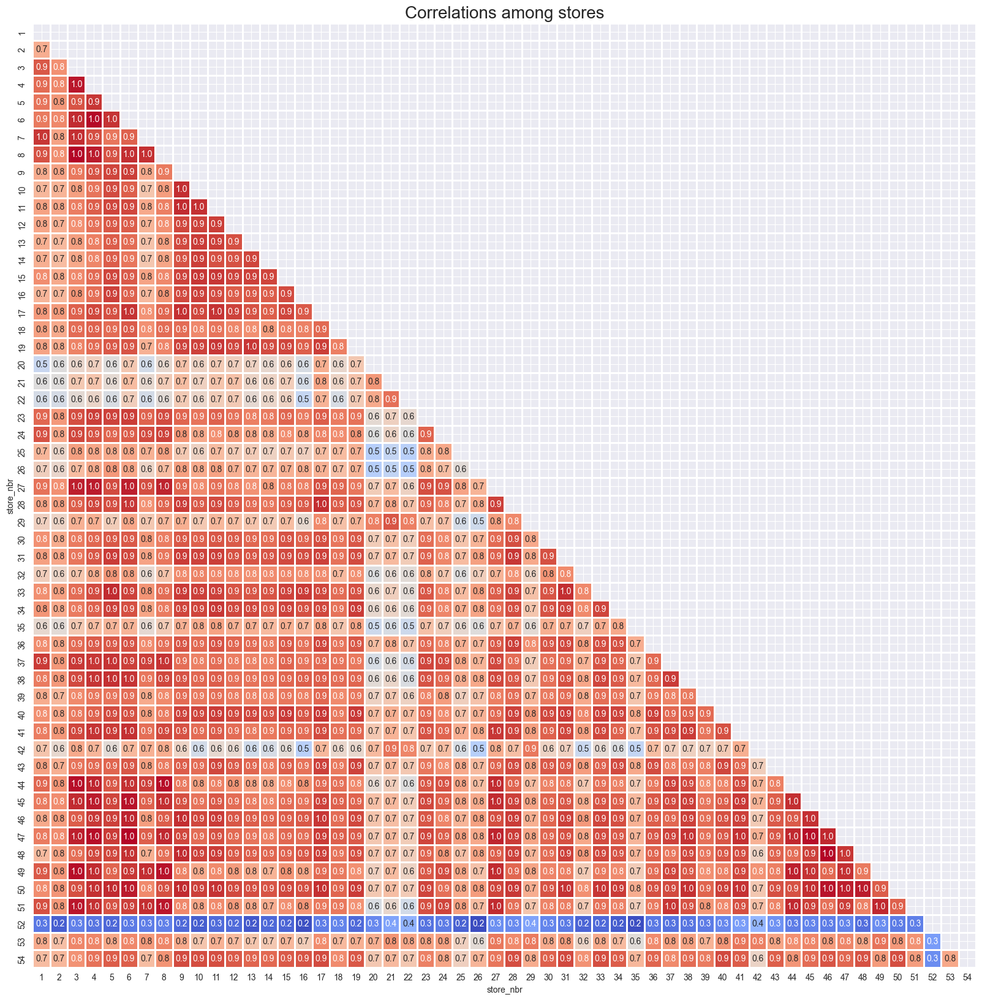

In [18]:
a = train[["store_nbr", "sales"]]
a["ind"] = 1
a["ind"] = a.groupby("store_nbr").ind.cumsum().values
a = pd.pivot(a, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(a.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(a,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()



In [19]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train.shape

(3000888, 6)


(2780316, 6)